In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

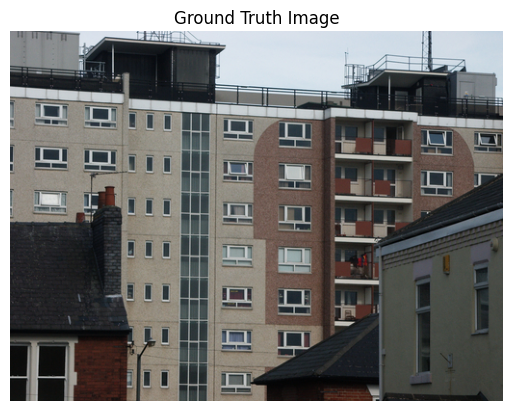

In [ ]:
gt_image_path = '/content/drive/MyDrive/IP_Dataset/rainy3gt.jpg'
ground_truth_image = cv2.imread(gt_image_path)

plt.axis('off')
plt.title('Ground Truth Image')
plt.imshow(cv2.cvtColor(ground_truth_image, cv2.COLOR_BGR2RGB))

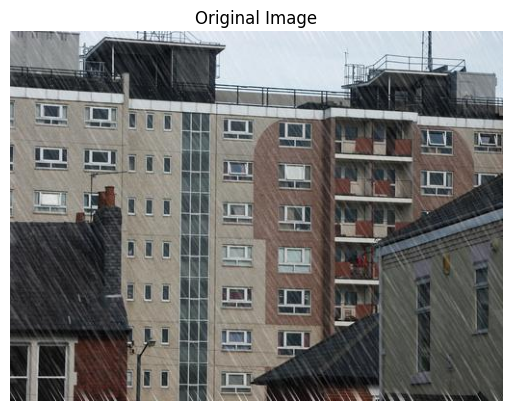

In [ ]:
image_path = '/content/drive/MyDrive/IP_Dataset/rainy3.jpg'
image = cv2.imread(image_path)

plt.axis('off')
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

# Method 1 - Morphological Processing

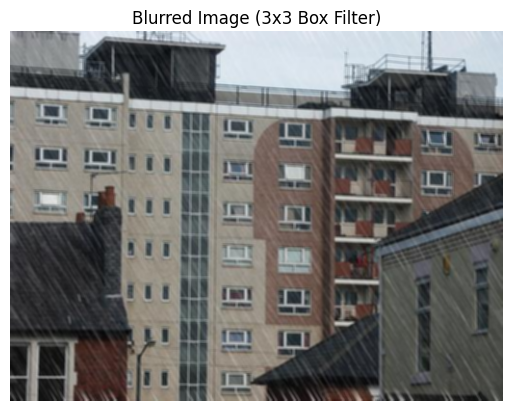

In [ ]:
blurred_image = cv2.blur(image, (3, 3))

plt.figure()
plt.axis('off')
plt.title('Blurred Image (3x3 Box Filter)')
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.show()

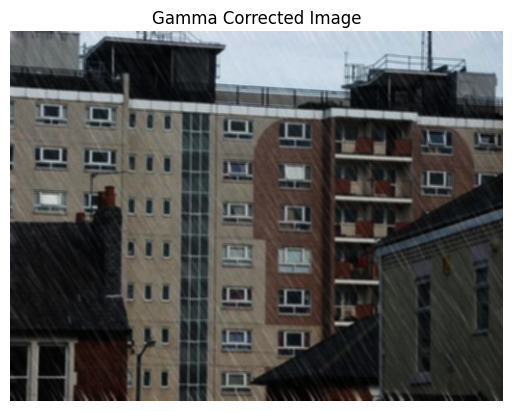

In [ ]:
#Gamma Correction
gamma = 1.5
lookUpTable = np.empty((1, 256), np.uint8)
for i in range(256):
    lookUpTable[0, i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

gamma_corrected_image = cv2.LUT(blurred_image, lookUpTable)

plt.figure()
plt.axis('off')
plt.title('Gamma Corrected Image')
plt.imshow(cv2.cvtColor(gamma_corrected_image, cv2.COLOR_BGR2RGB))
plt.show()

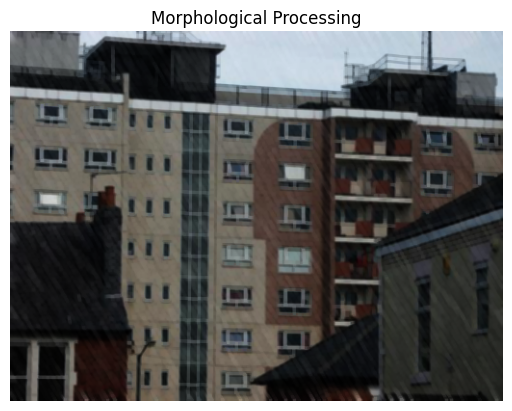

In [ ]:
kernel = np.ones((3, 3), dtype=np.uint8)
'''kernel = np.array([0,1,0,
                   1,1,1,
                   0,1,0], dtype=np.uint8)'''
eroded_image = cv2.erode(gamma_corrected_image, kernel, iterations=1)
dilated_image = cv2.dilate(eroded_image, kernel, iterations=1)

plt.figure()
plt.axis('off')
plt.title('Morphological Processing')
plt.imshow(cv2.cvtColor(dilated_image, cv2.COLOR_BGR2RGB))
plt.show()

Brightness Increase: 33.35986328125


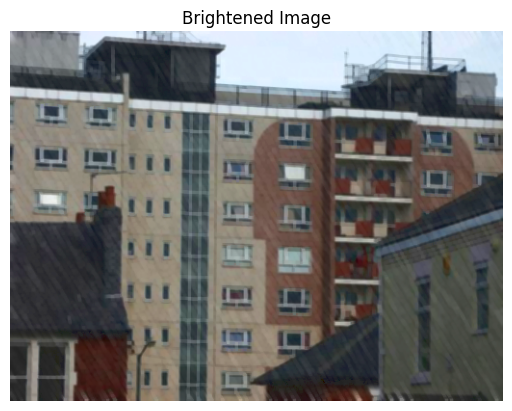

In [ ]:
#Increase Brightness
brightness_increase = (np.mean(image) - np.mean(dilated_image))
print(f"Brightness Increase: {brightness_increase}")

hsv_image = cv2.cvtColor(dilated_image, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv_image)
v = cv2.add(v, brightness_increase)
v[v > 255] = 255
hsv_image = cv2.merge((h, s, v))
brightened_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)

plt.figure()
plt.axis('off')
plt.title('Brightened Image')
plt.imshow(cv2.cvtColor(brightened_image, cv2.COLOR_BGR2RGB))
plt.show()

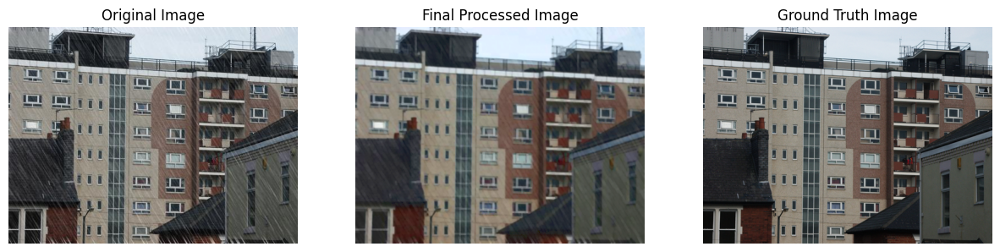

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 10))
final_image = brightened_image

axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
axes[1].set_title('Final Processed Image')
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(ground_truth_image, cv2.COLOR_BGR2RGB))
axes[2].set_title('Ground Truth Image')
axes[2].axis('off')

plt.show()

In [ ]:
from skimage.metrics import peak_signal_noise_ratio

original_psnr = peak_signal_noise_ratio(ground_truth_image, image)
print(f"Original PSNR: {original_psnr:.2f} dB")

processed_psnr = peak_signal_noise_ratio(ground_truth_image, final_image)
print(f"PSNR after Processing: {processed_psnr:.2f} dB")

Original PSNR: 25.67 dB
PSNR after Processing: 22.53 dB


In [ ]:
from image_similarity_measures.quality_metrics import ssim

original_ssim = ssim(ground_truth_image, image)
print(f"Original SSIM: {original_ssim:.4f}")

processed_ssim = ssim(ground_truth_image, final_image)
print(f"SSIM after Processing: {processed_ssim:.4f}")

Original SSIM: 0.9839
SSIM after Processing: 0.9708


In [ ]:
images = [['/content/drive/MyDrive/IP_Dataset/101_10.jpg', '/content/drive/MyDrive/IP_Dataset/101.jpg'],
          ['/content/drive/MyDrive/IP_Dataset/106_12.jpg', '/content/drive/MyDrive/IP_Dataset/106.jpg'],
          ['/content/drive/MyDrive/IP_Dataset/111_4.jpg', '/content/drive/MyDrive/IP_Dataset/111.jpg'],
          ['/content/drive/MyDrive/IP_Dataset/rainy3.jpg', '/content/drive/MyDrive/IP_Dataset/rainy3gt.jpg']]

In [ ]:
def complete_method(images):

  def process_image(image):

    blurred_image = cv2.blur(image, (3, 3))

    gamma = 1.5
    lookUpTable = np.empty((1, 256), np.uint8)
    for i in range(256):
        lookUpTable[0, i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

    gamma_corrected_image = cv2.LUT(blurred_image, lookUpTable)

    kernel = np.ones((3, 3), dtype=np.uint8)
    eroded_image = cv2.erode(gamma_corrected_image, kernel, iterations=1)
    dilated_image = cv2.dilate(eroded_image, kernel, iterations=1)

    brightness_increase = (np.mean(image) - np.mean(dilated_image))

    hsv_image = cv2.cvtColor(dilated_image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv_image)
    v = cv2.add(v, brightness_increase)
    v[v > 255] = 255
    hsv_image = cv2.merge((h, s, v))
    brightened_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)

    return brightened_image

  for image_path, gt_image_path in images:
    image = cv2.imread(image_path)
    ground_truth_image = cv2.imread(gt_image_path)
    final_image = process_image(image)

    fig, axes = plt.subplots(1, 3, figsize=(30, 5))

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f'Original Image - PSNR {peak_signal_noise_ratio(ground_truth_image, image):.2f}; SSIM {ssim(ground_truth_image, image):.4f}')
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f'Final Processed Image - PSNR {peak_signal_noise_ratio(ground_truth_image, final_image):.2f}; SSIM {ssim(ground_truth_image, final_image):.4f}')
    axes[1].axis('off')

    axes[2].imshow(cv2.cvtColor(ground_truth_image, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Ground Truth Image')
    axes[2].axis('off')

    plt.show()

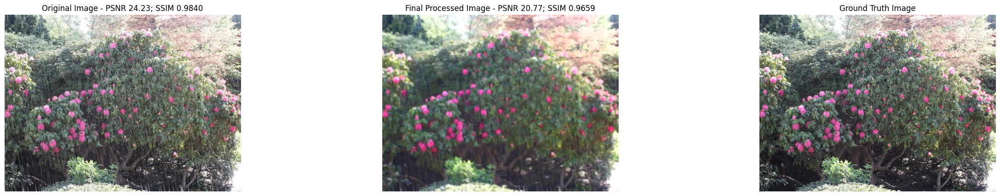

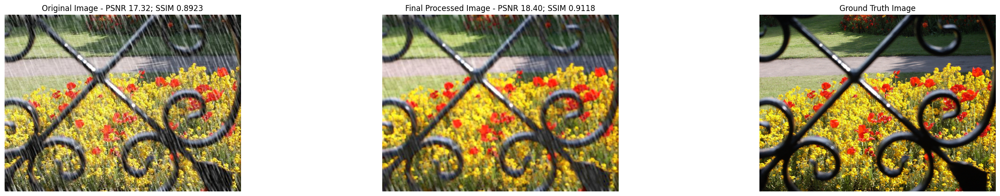

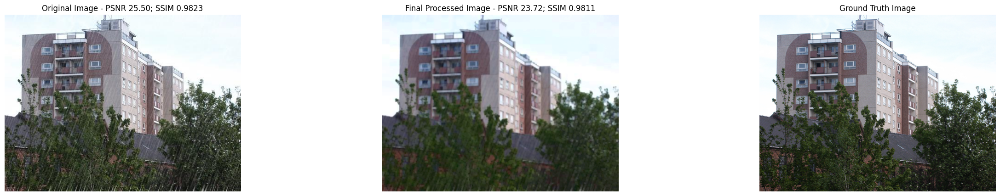

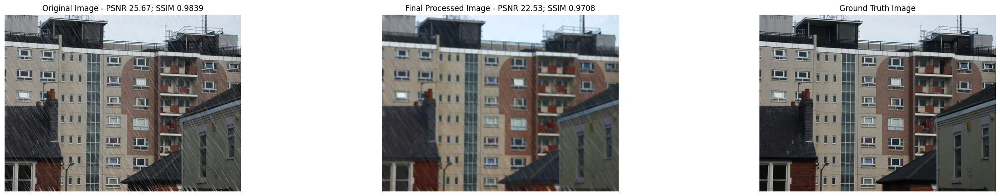

In [ ]:
complete_method(images)

# Method 2 - Inpainting

In [ ]:
gt_image_path = '/content/drive/MyDrive/IP_Dataset/118.jpg'
ground_truth_image = cv2.imread(gt_image_path)

image_path = '/content/drive/MyDrive/IP_Dataset/118_10.jpg'
image = cv2.imread(image_path)

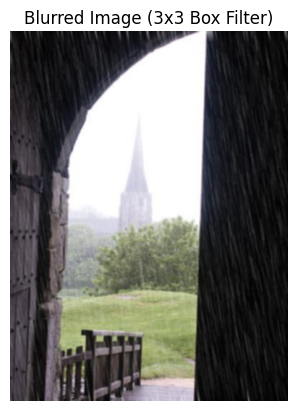

In [ ]:
blurred_image = cv2.blur(image, (3, 3))

plt.figure()
plt.axis('off')
plt.title('Blurred Image (3x3 Box Filter)')
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.show()

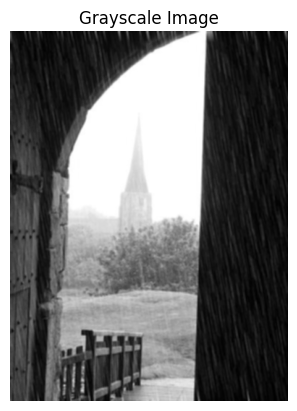

In [ ]:
gray_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)

plt.figure()
plt.axis('off')
plt.title('Grayscale Image')
plt.imshow(gray_image, cmap='gray')
plt.show()

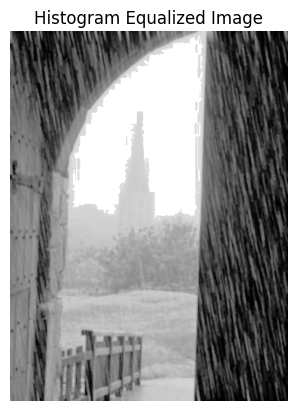

In [ ]:
equalized_image = cv2.equalizeHist(gray_image)

plt.figure()
plt.axis('off')
plt.title('Histogram Equalized Image')
plt.imshow(equalized_image, cmap='gray')
plt.show()

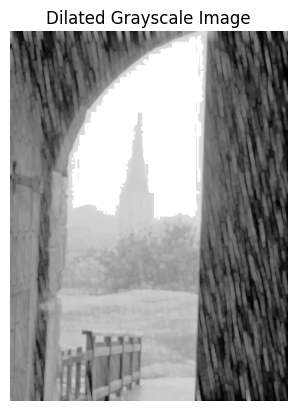

In [ ]:
kernel = np.ones((3, 3), np.uint8)

dilated_gray_image = cv2.dilate(equalized_image, kernel, iterations=1)

plt.figure()
plt.axis('off')
plt.title('Dilated Grayscale Image')
plt.imshow(dilated_gray_image, cmap='gray')
plt.show()

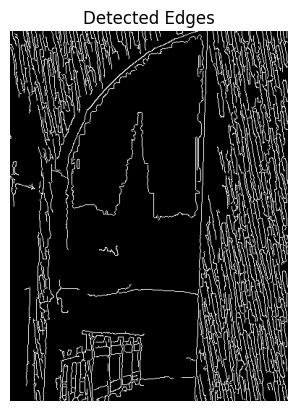

In [ ]:
edges = cv2.Canny(dilated_gray_image, 50, 150)

plt.figure()
plt.axis('off')
plt.title('Detected Edges')
plt.imshow(edges, cmap='gray')
plt.show()

mask = edges

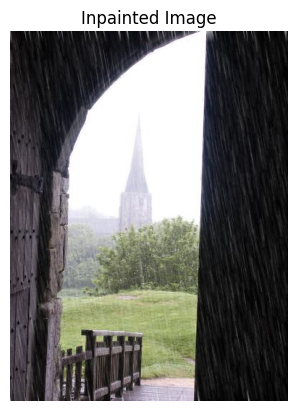

In [ ]:
inpainted_image = cv2.inpaint(image, mask, 3, cv2.INPAINT_TELEA)

plt.figure()
plt.axis('off')
plt.title('Inpainted Image')
plt.imshow(cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB))
plt.show()

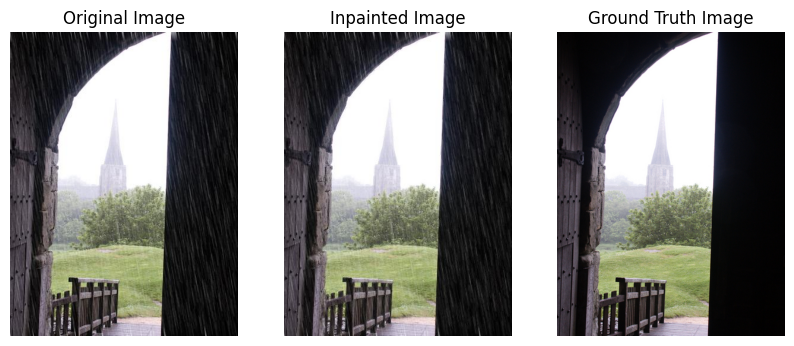

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(10, 5))

axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB))
axes[1].set_title('Inpainted Image')
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(ground_truth_image, cv2.COLOR_BGR2RGB))
axes[2].set_title('Ground Truth Image')
axes[2].axis('off')

plt.show()

In [ ]:
psnr = peak_signal_noise_ratio(ground_truth_image, image)
print(f"PSNR before Inpainting: {psnr:.2f} dB")

PSNR before Inpainting: 25.17 dB


In [ ]:
psnr_inpainted = peak_signal_noise_ratio(ground_truth_image, inpainted_image)
print(f"PSNR after Inpainting: {psnr_inpainted:.2f} dB")

PSNR after Inpainting: 24.61 dB
